1. Data pre-processing - Understand the data and treat missing values (Use box plot), outliers (5 points)
2. Understanding the attributes - Find relationship between different attributes (Independent variables) and choose carefully which all attributes have to be a part of the analysis and why (5 points)
3. Use PCA from scikit learn and elbow plot to find out reduced number of dimension (which covers more than 95% of the variance) - 10 points
4. Use Support vector machines and use grid search (try C values - 0.01, 0.05, 0.5, 1 and kernel = linear, rbf) and find out the best hyper parameters and do cross validation to find the accuracy. (10 points)


In [119]:
import pandas as pd  
import numpy as np  
import seaborn as sns
import matplotlib.pyplot as plt  
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix  
from sklearn.preprocessing import StandardScaler

In [120]:
df_vehicles = pd.read_csv("vehicle.csv")

In [121]:
df_vehicles.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [122]:
df_vehicles.shape

(846, 19)

In [123]:
df_vehicles.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


there are outliers based on above data

In [124]:
df_vehicles.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [125]:
df_vehicles.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

there are missing values in this dataset

In [126]:
col_list = ['circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio','scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2']

In [127]:
#Replacing all NaNs with mode of respective column
for i in col_list:
    df_vehicles[i] = df_vehicles[i].fillna(df_vehicles[i].mode()[0])

In [128]:
df_vehicles.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

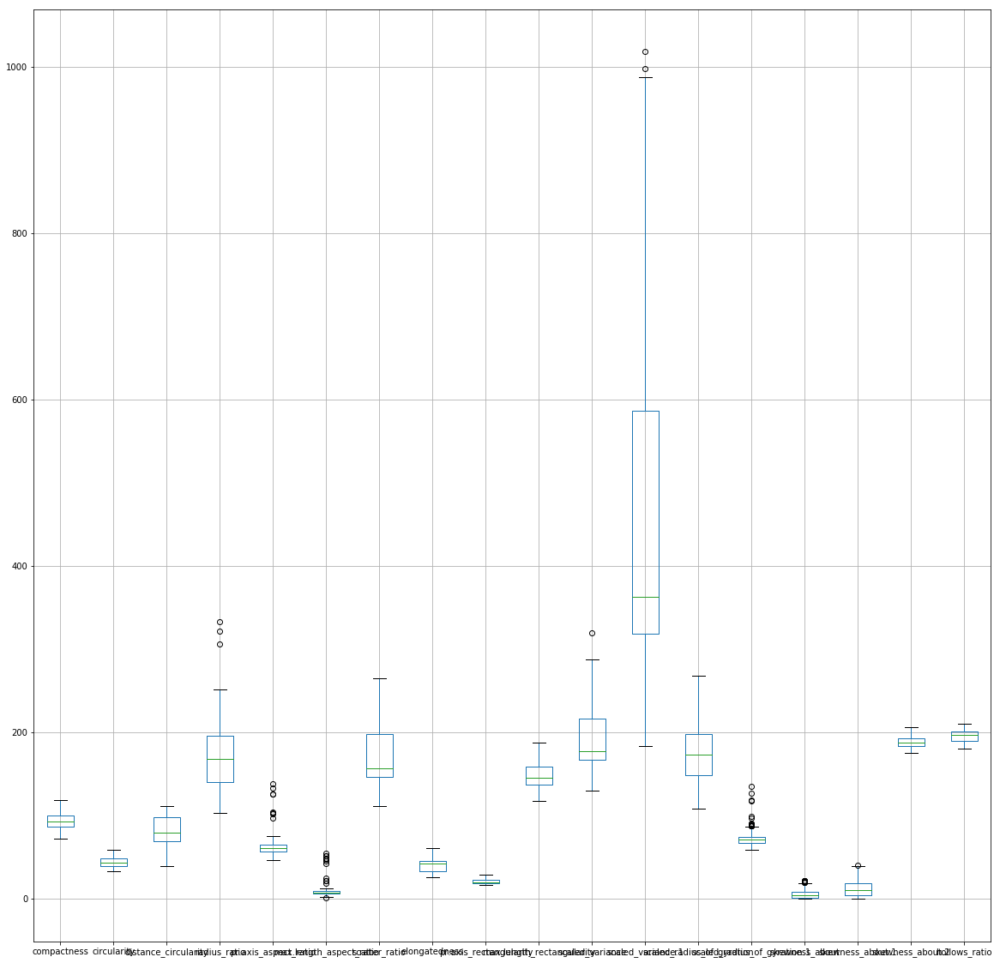

In [129]:
df_vehicles.boxplot(figsize=[20,20])

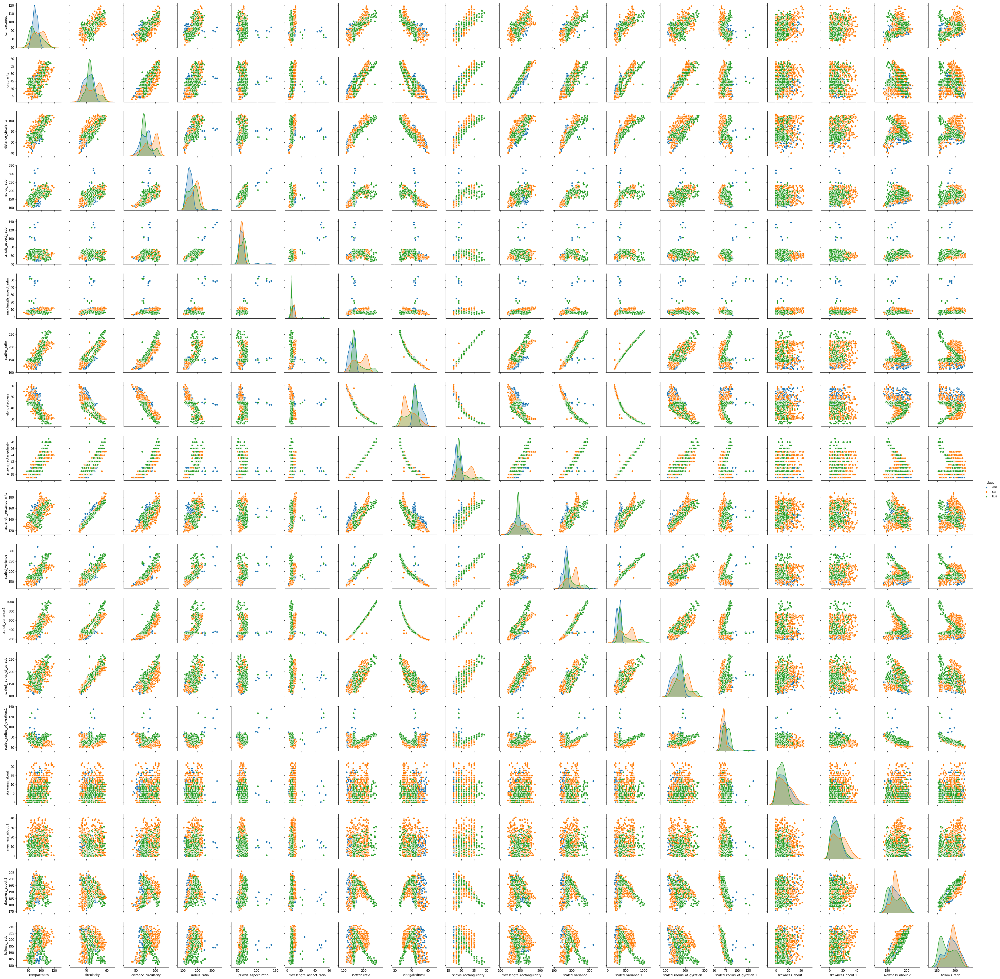

In [130]:
sns.pairplot(df_vehicles, hue='class', diag_kind='kde')

There is a lot of overlap in below columns for each vehicle type so would not play an important role
pr.axis_aspect_ratio, scaled_radius_of_gyration.1, skewness_about, skewness_about.1, skewness_about.2

In [131]:
df_vehicles.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [132]:
df_vehicles.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.684145,0.788366,0.689442,0.092272,0.148249,0.812789,-0.787218,0.813453,0.676143,0.761188,0.812979,0.584258,-0.249847,0.240503,0.157015,0.298537,0.365552
circularity,0.684145,1.000000,0.789169,0.623521,0.155774,0.251743,0.847008,-0.818047,0.840759,0.960427,0.795359,0.833704,0.923894,0.050454,0.144755,-0.010939,-0.103320,0.047590
distance_circularity,0.788366,0.789169,1.000000,0.769806,0.159701,0.265021,0.903229,-0.908900,0.890173,0.771932,0.858847,0.883217,0.701703,-0.229022,0.116697,0.266833,0.148591,0.336238
radius_ratio,0.689442,0.623521,0.769806,1.000000,0.660709,0.448613,0.737076,-0.791090,0.711301,0.571485,0.794880,0.720280,0.538180,-0.180128,0.055514,0.171340,0.381869,0.469316
pr.axis_aspect_ratio,0.092272,0.155774,0.159701,0.660709,1.000000,0.648552,0.104590,-0.183838,0.081091,0.127859,0.273305,0.089818,0.122047,0.153010,-0.057257,-0.032941,0.240241,0.267684
max.length_aspect_ratio,0.148249,0.251743,0.265021,0.448613,0.648552,1.000000,0.166311,-0.179357,0.161281,0.305943,0.318863,0.143010,0.189308,0.295653,0.017729,0.043422,-0.026081,0.143919
scatter_ratio,0.812789,0.847008,0.903229,0.737076,0.104590,0.166311,1.000000,-0.970770,0.989342,0.809454,0.948434,0.992470,0.799532,-0.027617,0.076556,0.212197,0.005786,0.119026
elongatedness,-0.787218,-0.818047,-0.908900,-0.791090,-0.183838,-0.179357,-0.970770,1.000000,-0.947136,-0.773018,-0.935335,-0.951642,-0.763429,0.102957,-0.053962,-0.186796,-0.113864,-0.215576
pr.axis_rectangularity,0.813453,0.840759,0.890173,0.711301,0.081091,0.161281,0.989342,-0.947136,1.000000,0.809715,0.933228,0.986900,0.794954,-0.015874,0.087768,0.215182,-0.018359,0.099407
max.length_rectangularity,0.676143,0.960427,0.771932,0.571485,0.127859,0.305943,0.809454,-0.773018,0.809715,1.000000,0.744550,0.793817,0.866047,0.041410,0.136774,0.001366,-0.103948,0.076770


In [133]:
df_vehicles["class"].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

In [134]:
from scipy.stats import zscore

df_vehicles_attr = df_vehicles.drop(columns=['class'],axis=1)

# # A simple function that takes as input a column, find's its median, identifies outliers, replaces outliers with median     
def replace(x):
    median, std = x.median(), x.std()  #Get the median and the standard deviation of every column
    outliers = (x - median).abs() > 2*std # Subtract median from every member of each column. Take absolute values > 2std
    x[outliers] = x.median()       
    return x

df_vehicles_attr_corrected = df_vehicles_attr.apply(lambda x:x.transform(replace)) # transforming raw data using replace function
df_vehicles_treated = df_vehicles_attr_corrected.join(pd.DataFrame(df_vehicles['class']))  # joining back the numeric and non-numeric columns

/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/ashishsingh/anacon

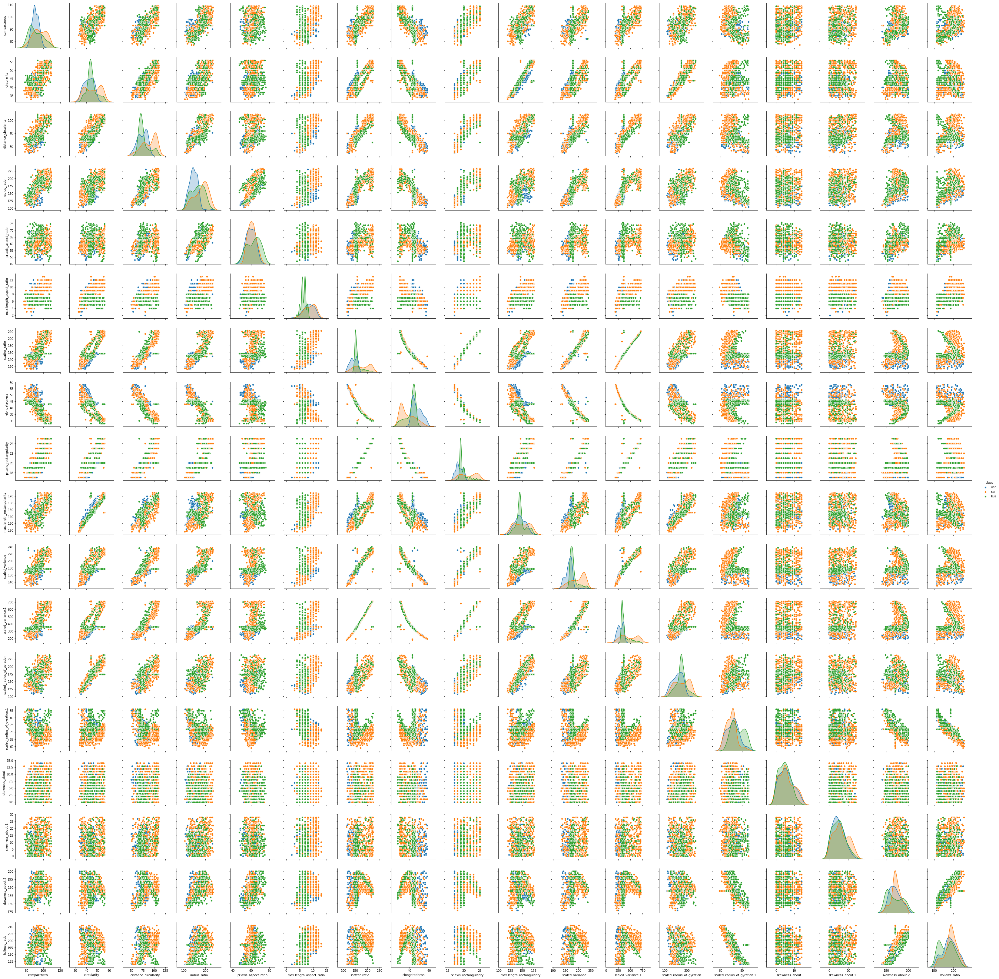

In [135]:
import seaborn as sns
sns.pairplot(df_vehicles_treated, hue = 'class', diag_kind = 'kde')

Based on above plot:

Columns which can be removed (there is too much overlap and no distinct mean values exist): 'pr.axis_aspect_ratio','max.length_rectangularity','scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1','skewness_about.2', 'hollows_ratio'

In [136]:
X_treated = df_vehicles_treated.drop('class', axis=1)  
y_treated = df_vehicles_treated['class'] 
X_treated_less_Cols = X_treated.drop(['pr.axis_aspect_ratio','max.length_rectangularity','scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1','skewness_about.2', 'hollows_ratio'],axis=1)

In [137]:
print(X_treated.shape)
print(y_treated.shape)
print(X_treated_less_Cols.shape)

(846, 18)
(846,)
(846, 11)


In [138]:
from sklearn.model_selection import train_test_split   

In [139]:
X_treated_train, X_treated_test, y_treated_train, y_treated_test = train_test_split(X_treated, y_treated, test_size = 0.30)  

In [140]:
X_treated_less_Cols_train, X_treated_less_Cols_test, y_treated_less_Cols_train, y_treated_less_Cols_test = train_test_split(X_treated_less_Cols, y_treated, test_size = 0.30)  

In [141]:
# We transform (centralize) the entire X (independent variable data) to zscores through transformation. We will create the PCA dimensions
# on this distribution. 
sc = StandardScaler()
X_treated_train_z =  sc.fit_transform(X_treated_train)          
train_cov_matrix = np.cov(X_treated_train_z.T)
print('Covariance Matrix \n%s', train_cov_matrix)

X_treated_less_Cols_train_z =  sc.fit_transform(X_treated_less_Cols_train)          
train_less_Cols_cov_matrix = np.cov(X_treated_less_Cols_train_z.T)
print('Covariance Matrix \n%s', train_less_Cols_cov_matrix)



Covariance Matrix 
%s [[ 1.00169205  0.61338977  0.74466785  0.71386508  0.19964784  0.49055343
   0.73876549 -0.73217025  0.75875156  0.60935771  0.71149495  0.69732394
   0.49370543 -0.25779764  0.16767037  0.18946362  0.35331645  0.36250725]
 [ 0.61338977  1.00169205  0.73984207  0.59576701  0.19293118  0.57536502
   0.77019879 -0.76314351  0.78790831  0.91402294  0.75577988  0.71444367
   0.89160901  0.06978765  0.13783785  0.04204339 -0.0280449   0.03236571]
 [ 0.74466785  0.73984207  1.00169205  0.79876523  0.24538874  0.65655496
   0.84833974 -0.87316685  0.87043861  0.70476831  0.86315748  0.80581486
   0.65966241 -0.21882017  0.12680276  0.26066844  0.21690905  0.2809012 ]
 [ 0.71386508  0.59576701  0.79876523  1.00169205  0.65972488  0.49022339
   0.80286315 -0.84775995  0.79968     0.51322089  0.83742349  0.76238517
   0.52493551 -0.41067458  0.05706711  0.18064293  0.49615416  0.46623252]
 [ 0.19964784  0.19293118  0.24538874  0.65972488  1.00169205  0.18294796
   0.3093392

/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [142]:
eigenvalues, eigenvectors = np.linalg.eig(train_cov_matrix)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

eigenvalues_less_Cols, eigenvectors_less_Cols = np.linalg.eig(train_less_Cols_cov_matrix)
print('Eigen Vectors \n%s', eigenvectors_less_Cols)
print('\n Eigen Values \n%s', eigenvalues_less_Cols)

Eigen Vectors 
%s [[-2.61432654e-01 -6.42208796e-02  1.55530147e-01  7.87994638e-02
   2.18903406e-02 -3.63201636e-01 -2.66856125e-01  7.24398144e-01
   4.82856002e-02  1.14437530e-01 -3.19229209e-01  1.45679720e-02
  -1.42118490e-01  9.43853588e-02  6.11211438e-02  5.90498820e-02
  -1.21309163e-01 -1.33554094e-02]
 [-2.72284482e-01  2.10881793e-01 -1.07123783e-01  1.94235708e-01
   6.14798323e-02  9.55204922e-02 -3.47309270e-01 -1.47518002e-01
  -7.41083224e-02  1.29137120e-02  9.04052924e-03 -4.98863527e-02
   3.52437814e-01  5.19101631e-01  2.30720611e-01 -2.14391876e-01
   7.34299733e-02 -4.12797591e-01]
 [-2.97702853e-01  1.17787927e-02  1.12115768e-01 -2.33249777e-02
   7.48977931e-02 -2.90975202e-02  1.12678712e-01  8.74973679e-02
  -5.38228649e-01 -1.36937533e-01  5.06063092e-01  2.02799694e-01
  -3.37729037e-01 -7.10631375e-02  7.27161885e-02  1.96641269e-01
  -3.60911369e-03 -3.20254241e-01]
 [-2.84060196e-01 -1.82284906e-01 -1.39786542e-01 -1.19466837e-01
  -2.13020548e-01  

In [143]:

# Step 3 (continued): Sort eigenvalues in descending order

# Make a set of (eigenvalue, eigenvector) pairs
train_eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]

# Sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalue
train_eig_pairs.sort()

train_eig_pairs.reverse()
print(train_eig_pairs)

# Extract the descending ordered eigenvalues and eigenvectors
train_eigvalues_sorted = [train_eig_pairs[index][0] for index in range(len(eigenvalues))]
train_eigvectors_sorted = [train_eig_pairs[index][1] for index in range(len(eigenvalues))]

# Let's confirm our sorting worked, print out eigenvalues
print('Eigenvalues in descending order: \n%s' %train_eigvalues_sorted)


# Step 3 (continued): Sort eigenvalues in descending order

# Make a set of (eigenvalue, eigenvector) pairs
train_eig_pairs_less_Cols = [(eigenvalues_less_Cols[index], eigenvectors_less_Cols[:,index]) for index in range(len(eigenvalues_less_Cols))]

# Sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalue
train_eig_pairs_less_Cols.sort()

train_eig_pairs_less_Cols.reverse()
print(train_eig_pairs_less_Cols)

# Extract the descending ordered eigenvalues and eigenvectors
train_eigvalues_sorted_less_Cols = [train_eig_pairs_less_Cols[index][0] for index in range(len(eigenvalues_less_Cols))]
train_eigvectors_sorted_less_Cols = [train_eig_pairs_less_Cols[index][1] for index in range(len(eigenvalues_less_Cols))]

# Let's confirm our sorting worked, print out eigenvalues
print('Eigenvalues in descending order: \n%s' %train_eigvalues_sorted_less_Cols)





[(9.506577232146729, array([-0.26143265, -0.27228448, -0.29770285, -0.2840602 , -0.12564395,
       -0.22140352, -0.30819255,  0.30831869, -0.30849332, -0.25421522,
       -0.30638428, -0.29349033, -0.24744075,  0.07472111, -0.04096378,
       -0.07048953, -0.09160054, -0.10816156])), (2.9815084143452717, array([-0.06422088,  0.21088179,  0.01177879, -0.18228491, -0.25109317,
       -0.01797983,  0.04941997, -0.02067468,  0.06600425,  0.21664626,
        0.02855761,  0.02541667,  0.26410867,  0.5040258 ,  0.02939357,
       -0.02709972, -0.49483723, -0.47831561])), (1.1457096838894016, array([ 0.15553015, -0.10712378,  0.11211577, -0.13978654, -0.47325815,
        0.10008438,  0.01655349,  0.01639955,  0.03891148, -0.06869442,
       -0.02407267,  0.0117273 , -0.14247628, -0.06342903,  0.48228478,
        0.6554241 , -0.00996408,  0.06434361])), (1.060380113765565, array([ 0.07879946,  0.19423571, -0.02332498, -0.11946684, -0.15968936,
        0.16200641, -0.10860736,  0.12625719, -0.0

In [144]:
tot = sum(eigenvalues)
var_explained = [(i / tot) for i in sorted(train_eigvalues_sorted, reverse=True)]  # an array of variance explained by each 
# eigen vector... there will be 18 entries as there are 18 eigen vectors)
cum_var_exp = np.cumsum(var_explained)  # an array of cumulative variance. There will be 18 entries with 8 th entry 
# cumulative reaching almost 100%


tot_less_Cols = sum(eigenvalues_less_Cols)
var_explained_less_Cols = [(i / tot_less_Cols) for i in sorted(train_eigvalues_sorted_less_Cols, reverse=True)]  # an array of variance explained by each 
# eigen vector... there will be 18 entries as there are 18 eigen vectors)
cum_var_exp_less_Cols = np.cumsum(var_explained_less_Cols)  # an array of cumulative variance. There will be 18 entries with 8 th entry 
# cumulative reaching almost 100%

In [145]:
print(tot)
print(var_explained)
print(cum_var_exp)

print(tot_less_Cols)
print(var_explained_less_Cols)
print(cum_var_exp_less_Cols)

18.030456852791886
[0.5272510458144439, 0.1653595601424601, 0.06354302019319032, 0.05881049617449781, 0.049862653981841344, 0.03522471788064359, 0.0228970222565695, 0.017935712903875127, 0.011870396794363353, 0.010366193645383846, 0.00963687590799475, 0.008420282179874401, 0.005583650768440492, 0.0037533034664825617, 0.0028922885910927084, 0.002546703921747931, 0.0022724634292144116, 0.0017736119478840204]
[0.52725105 0.69261061 0.75615363 0.81496412 0.86482678 0.90005149
 0.92294852 0.94088423 0.95275463 0.96312082 0.9727577  0.98117798
 0.98676163 0.99051493 0.99340722 0.99595392 0.99822639 1.        ]
11.018612521150597
[0.7760879600012757, 0.06447221716424888, 0.052667699327869, 0.03560529096111005, 0.02257436907872364, 0.014158890098105238, 0.011536697927407144, 0.009125040617437396, 0.005484243798733045, 0.004947101009298793, 0.0033404900157908966]
[0.77608796 0.84056018 0.89322788 0.92883317 0.95140754 0.96556643
 0.97710312 0.98622817 0.99171241 0.99665951 1.        ]


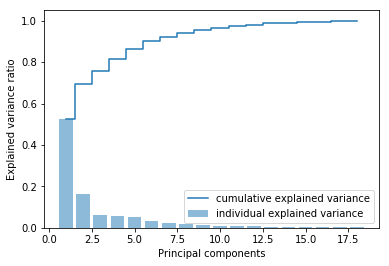

In [146]:
plt.bar(range(1,19), var_explained, alpha=0.5, align='center', label='individual explained variance')
plt.step(range(1,19),cum_var_exp, where= 'mid', label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc = 'best')
plt.show()

Based on above, Reducing to 9 dimensions as those are covering more than 95% variance/information

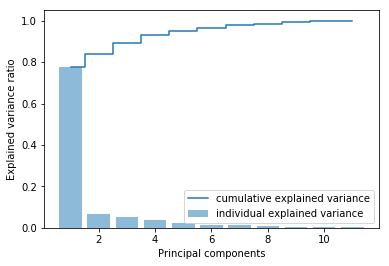

In [147]:
plt.bar(range(1,12), var_explained_less_Cols, alpha=0.5, align='center', label='individual explained variance')
plt.step(range(1,12),cum_var_exp_less_Cols, where= 'mid', label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc = 'best')
plt.show()

Based on above, Reducing to 5 dimensions as those are covering more than 95% variance/information

In [148]:
# P_reduce represents reduced mathematical space....

P_reduce = np.array(train_eigvectors_sorted[0:9])   # Reducing from 18 to 9 dimension space

X_std_9D = np.dot(X_treated_train_z,P_reduce.T)   # projecting original data into principal component dimensions

Proj_data_df = pd.DataFrame(X_std_9D)  # converting array to dataframe for pairplot


# P_reduce represents reduced mathematical space....

P_reduce_less_Cols = np.array(train_eigvectors_sorted_less_Cols[0:5])   # Reducing from 11 to 5 dimension space

X_std_5D = np.dot(X_treated_less_Cols_train_z,P_reduce_less_Cols.T)   # projecting original data into principal component dimensions

Proj_data_df_less_Cols = pd.DataFrame(X_std_5D)  # converting array to dataframe for pairplot

In [149]:
from sklearn import model_selection

test_size = 0.30 # taking 70:30 training and test set
seed = 7  # Random numbmer seeding for reapeatability of the code
X_train, X_test, y_train, y_test = model_selection.train_test_split(Proj_data_df, y_treated_train, test_size=test_size, random_state=seed)

X_train_less_Cols, X_test_less_Cols, y_train_less_Cols, y_test_less_Cols = model_selection.train_test_split(Proj_data_df_less_Cols, y_treated_less_Cols_train, test_size=test_size, random_state=seed)

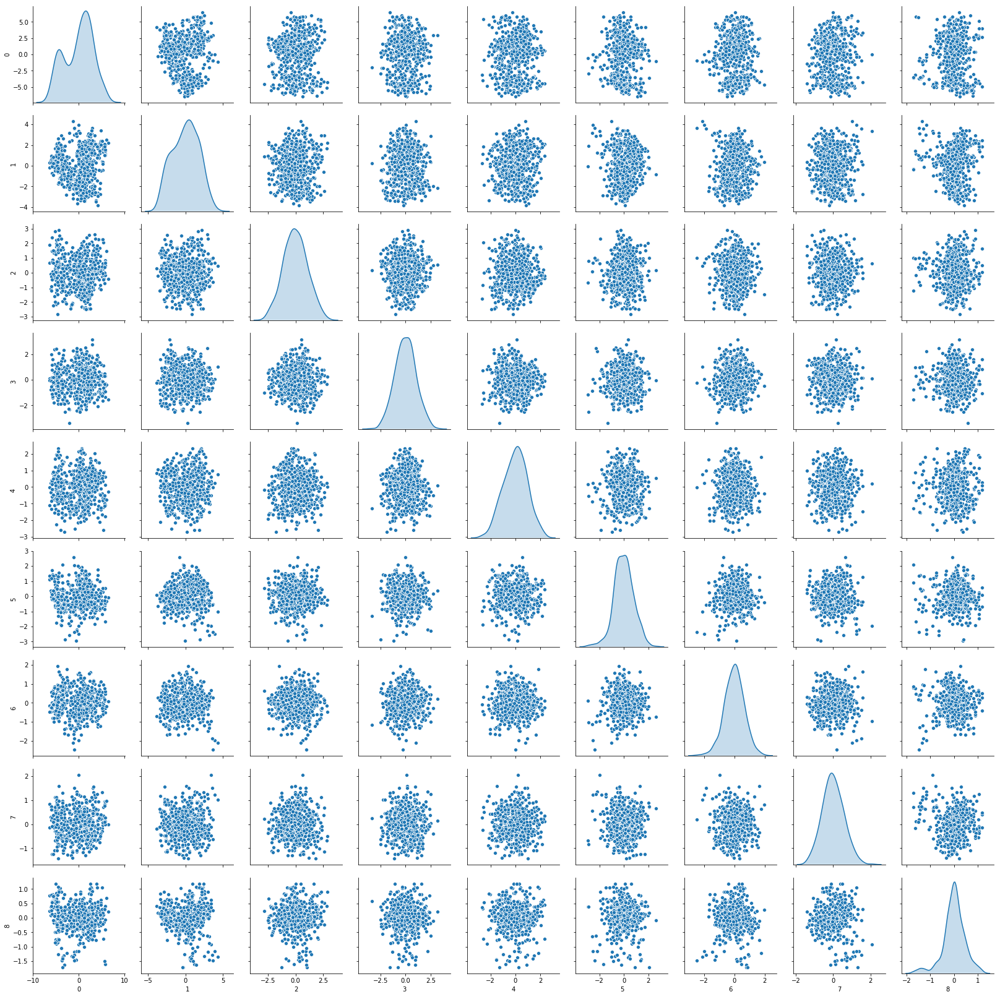

In [150]:
#Let us check it visually
Proj_data_vehicle_df = Proj_data_df.join(y_treated)

sns.pairplot(Proj_data_vehicle_df, diag_kind='kde') 

Most of the data points are scattered in circular shape which means 9 dimensions have captured most of the information

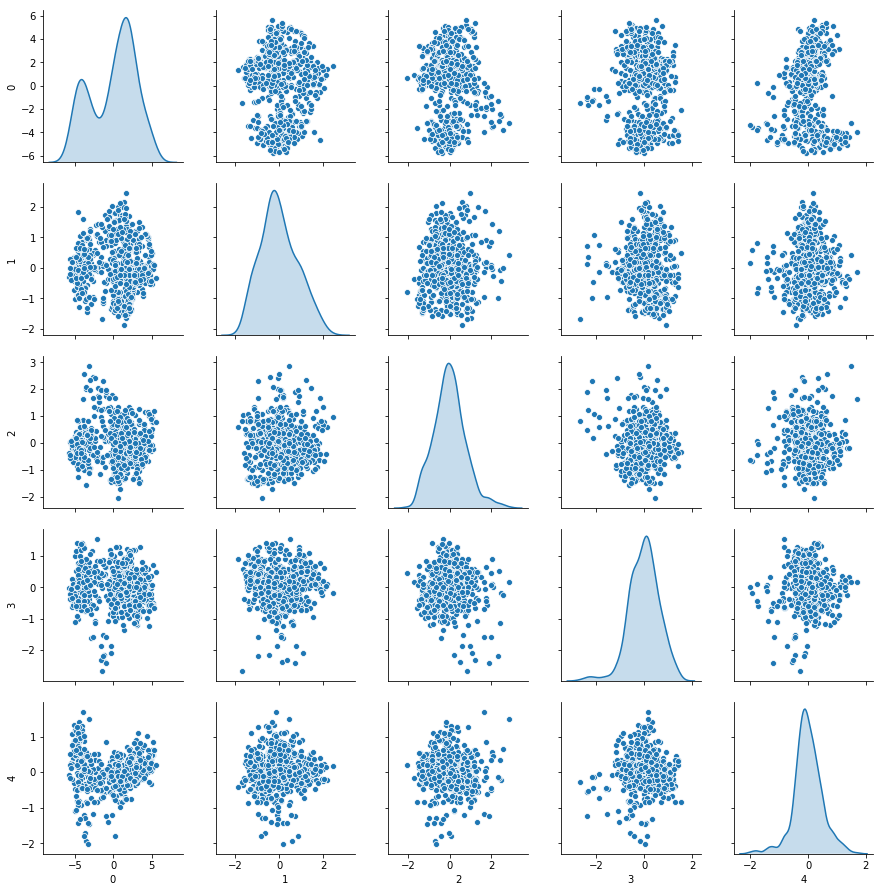

In [151]:
#Let us check it visually
Proj_data_vehicle_df_less_Cols = Proj_data_df_less_Cols.join(y_treated)

sns.pairplot(Proj_data_vehicle_df_less_Cols, diag_kind='kde') 

Most of the data points are scattered in circular shape which means 5 dimensions have captured most of the information

In [152]:
X_test_std =  sc.fit_transform(X_treated_test) 

X_test_std_9D = np.dot(X_test_std,P_reduce.T)   # projecting original data into principal component dimensions



X_test_std_less_Cols =  sc.fit_transform(X_treated_less_Cols_test) 

X_test_std_5D = np.dot(X_test_std_less_Cols,P_reduce_less_Cols.T)   # projecting original data into principal component dimensions




/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [153]:
X_test_std.shape

(254, 18)

In [154]:
X_test_std_9D.shape

(254, 9)

In [155]:
from sklearn.svm import SVC  

In [156]:
C_values = [0.01,0.05, 0.5, 1]

In [157]:

for i in C_values:
    svclassifier_linear = SVC(C=i,kernel='linear')  
    svclassifier_linear.fit(X_train, y_train) 
    y_pred_linear = svclassifier_linear.predict(X_test) 
    
    svclassifier_linear_less_Cols = SVC(C=i,kernel='linear')  
    svclassifier_linear_less_Cols.fit(X_train_less_Cols, y_train_less_Cols) 
    y_pred_linear_less_Cols = svclassifier_linear_less_Cols.predict(X_test_less_Cols) 
    
#RBF
    svclassifier_rbf = SVC(C=i,kernel='rbf')  
    svclassifier_rbf.fit(X_train, y_train)  
    y_pred_rbf = svclassifier_rbf.predict(X_test)  

    
    svclassifier_rbf_less_Cols = SVC(C=i,kernel='rbf')  
    svclassifier_rbf_less_Cols.fit(X_train_less_Cols, y_train_less_Cols)  
    y_pred_rbf_less_Cols = svclassifier_rbf_less_Cols.predict(X_test_less_Cols)  
   

    print("Train Score for Linear for C value {} is:{}".format(i,svclassifier_linear.score(X_train, y_train))) 
    print("Test Score for Linear for C value {} is:{}".format(i,svclassifier_linear.score(X_test, y_test))) 
    print("Test(original) Score for Linear for C value {} is:{}\n".format(i,svclassifier_linear.score(X_test_std_9D, y_treated_test))) 

    print("less_Cols-Train Score for Linear for C value {} is:{}".format(i,svclassifier_linear_less_Cols.score(X_train_less_Cols, y_train_less_Cols))) 
    print("less_Cols-Test Score for Linear for C value {} is:{}".format(i,svclassifier_linear_less_Cols.score(X_test_less_Cols, y_test_less_Cols))) 
    print("less_Cols-Test(original) Score for Linear for C value {} is:{}\n".format(i,svclassifier_linear_less_Cols.score(X_test_std_5D, y_treated_less_Cols_test))) 

    print("Train Score for RBF for C value {} is:{}".format(i,svclassifier_rbf.score(X_train, y_train))) 
    print("Test Score for RBF for C value {} is:{}".format(i,svclassifier_rbf.score(X_test, y_test))) 
    print("Test(original) Score for RBF for C value {} is:{}\n".format(i,svclassifier_rbf.score(X_test_std_9D, y_treated_test))) 

    print("less_Cols-Train Score for RBF for C value {} is:{}".format(i,svclassifier_rbf_less_Cols.score(X_train_less_Cols, y_train_less_Cols))) 
    print("less_Cols-Test Score for RBF for C value {} is:{}".format(i,svclassifier_rbf_less_Cols.score(X_test_less_Cols, y_test_less_Cols))) 
    print("less_Cols-Test(original) Score for RBF for C value {} is:{}\n".format(i,svclassifier_rbf_less_Cols.score(X_test_std_5D, y_treated_less_Cols_test))) 



Train Score for Linear for C value 0.01 is:0.8478260869565217
Test Score for Linear for C value 0.01 is:0.848314606741573
Test(original) Score for Linear for C value 0.01 is:0.8307086614173228

less_Cols-Train Score for Linear for C value 0.01 is:0.7101449275362319
less_Cols-Test Score for Linear for C value 0.01 is:0.7303370786516854
less_Cols-Test(original) Score for Linear for C value 0.01 is:0.6614173228346457

Train Score for RBF for C value 0.01 is:0.5144927536231884
Test Score for RBF for C value 0.01 is:0.5056179775280899
Test(original) Score for RBF for C value 0.01 is:0.49606299212598426

less_Cols-Train Score for RBF for C value 0.01 is:0.5144927536231884
less_Cols-Test Score for RBF for C value 0.01 is:0.5056179775280899
less_Cols-Test(original) Score for RBF for C value 0.01 is:0.49606299212598426

Train Score for Linear for C value 0.05 is:0.8719806763285024
Test Score for Linear for C value 0.05 is:0.8539325842696629
Test(original) Score for Linear for C value 0.05 is:0.

/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/ashishsingh/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/ashishsingh/anaconda3/lib/pyth

Based on the above scores, the best score we get is for RBF with C value of 1. With less columns(5), the score is lesser so will go with 9 columns